In [110]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
from copy import copy
import altair as alt

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score

In [111]:
data  = pd.read_pickle('./Data/OpenAlex/openalex-data-plosone-2000-2010-train-04.pkl')
data.dropna
data.set_index('id', inplace=True)
#data=data.drop('https://openalex.org/W2031611770')
data.head()

,title,publication_year,countries_distinct_count,institutions_distinct_count,referenced_works_count,cited_by_count,authors_distinct_count,any_author_has_retraction,min_retracted_author_rank,has_1pct_retracted_author,...,has_10pct_retracted_author,top_percentile_retracted_author,frac_author_repeat_offenders,any_institution_has_retraction,min_retracted_institution_rank,has_1pct_retracted_institution,has_5pct_retracted_institution,has_10pct_retracted_institution,top_percentile_retracted_institution,is_retracted
id,,,,,,,,,,,,,,,,,,,,,
https://openalex.org/W2031611770,FastTree 2 – Approximately Maximum-Likelihood ...,2010,1,2,30,10411,3,False,-inf,False,...,False,0.000000,0.0,True,284.0,False,True,True,95.046385,False
https://openalex.org/W2041257508,progressiveMauve: Multiple Genome Alignment wi...,2010,1,2,62,3254,3,False,-inf,False,...,False,0.000000,0.0,True,257.0,False,True,True,95.518992,False
https://openalex.org/W2169773990,Rapid SNP Discovery and Genetic Mapping Using ...,2008,1,1,18,2920,9,False,-inf,False,...,False,0.000000,0.0,True,843.0,False,False,False,85.261684,False
https://openalex.org/W2071754162,Source Partitioning Using Stable Isotopes: Cop...,2010,2,3,24,2321,4,False,-inf,False,...,False,0.000000,0.0,True,414.5,False,False,True,92.762121,False
https://openalex.org/W2135989088,Gut Microbiota in Human Adults with Type 2 Dia...,2010,1,2,36,2293,10,True,4773.5,False,...,True,88.490293,0.1,True,233.5,False,True,True,95.930334,False


# Data Processing

First, change data types of features to be numerical. We also remove the `id`, `title`, and `authorships` columns since these will not be used in the predictive model. I am also removing the `min_rank` features since they contain entries with a value of `-inf`.

In [112]:
reduced_data = data.drop(columns=['title', 'min_retracted_author_rank', 'min_retracted_institution_rank'])

for col in reduced_data.columns:
    if reduced_data[col].dtype == bool:
        reduced_data[col] = reduced_data[col].astype(int)
    elif col in ['publication_year', 'countries_distinct_count', 'institutions_distinct_count', 'referenced_works_count', 'cited_by_count', 'authors_distinct_count']:
        reduced_data[col] = reduced_data[col].astype(float)

reduced_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15809 entries, https://openalex.org/W2031611770 to https://openalex.org/W2561286610
Data columns (total 18 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   publication_year                      15809 non-null  float64
 1   countries_distinct_count              15809 non-null  float64
 2   institutions_distinct_count           15809 non-null  float64
 3   referenced_works_count                15809 non-null  float64
 4   cited_by_count                        15809 non-null  float64
 5   authors_distinct_count                15809 non-null  float64
 6   any_author_has_retraction             15809 non-null  int64  
 7   has_1pct_retracted_author             15809 non-null  int64  
 8   has_5pct_retracted_author             15809 non-null  int64  
 9   has_10pct_retracted_author            15809 non-null  int64  
 10  top_percentile_retracted_auth

Now, split into train and test sets. From here, we standardize the features with type `float` to be mean zero with standard deviation 1. Note that we apply the same transformations to both the train and test sets.

In [139]:
X_train, X_test = train_test_split(reduced_data.copy(), test_size = 0.2, random_state=123)

y_train, y_test = X_train['is_retracted'].values, X_test['is_retracted'].values

In [140]:
for col in X_train.columns:
    if X_train[col].dtype == float:
        mean = X_train[col].mean()
        std = X_train[col].std()
        X_train[col] = (X_train[col] - mean)/std
        X_test[col] = (X_test[col] - mean)/std  

# Model Selection

We will use logistic regression to build a binary classifier for retracted vs non-retracted papers. Our dataset has 17 features and so we first need to choose an optimal set of predictors for our classifier. We use forward stepwise selection to iteratively build models with 0-19 total features and then use 10-fold cross-validation to choose the best out of these models.

In [141]:
# Forward stepwise selection

subsets = [[]]

features = list(X_train.columns)
features.remove('is_retracted')

for i in range(len(X_train.columns)-1):
    current_features = copy(subsets[i])

    best_accuracy  = 0

    for feature in features:
        model = LogisticRegression()
        test_features = current_features.copy()
        test_features.append(feature)

        X_tt = X_train[test_features]
        model.fit(X_tt, y_train)

        accuracy = f1_score(y_train, model.predict(X_tt))
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            new_feature = feature

    current_features.append(new_feature)
    if features != []:
        features.remove(new_feature)
        subsets.append(current_features)





In [142]:
# Cross-Validation to choose best feature subset

kfold = KFold(n_splits = 10, shuffle=True, random_state=123)

accuracies = np.zeros((len(subsets), 10))

i = 0

for train_index, test_index in kfold.split(X_train):
    X_tt = X_train.iloc[train_index]
    X_val = X_train.iloc[test_index]

    # Baseline model

    baseline = np.zeros(len(X_val))

    accuracies[0, i] = f1_score(X_val.is_retracted, baseline)

    for j in range(len(subsets)-1):
        subset = subsets[j+1]
        model = LogisticRegression()

        model.fit(X_tt[subset], X_tt.is_retracted.values)
        accuracies[j+1,i] = f1_score(X_val.is_retracted.values, model.predict(X_val[subset]))
    i +=1

In [143]:
for i in range(len(subsets)):
    print('Subset', i, 'Accuracy:',np.mean(accuracies[i]))

Subset 0 Accuracy: 0.0
Subset 1 Accuracy: 0.42103174603174603
Subset 2 Accuracy: 0.4138888888888889
Subset 3 Accuracy: 0.40888888888888897
Subset 4 Accuracy: 0.40888888888888897
Subset 5 Accuracy: 0.4138888888888889
Subset 6 Accuracy: 0.4011111111111111
Subset 7 Accuracy: 0.43769841269841275
Subset 8 Accuracy: 0.4726984126984128
Subset 9 Accuracy: 0.4726984126984128
Subset 10 Accuracy: 0.47547619047619055
Subset 11 Accuracy: 0.4354761904761905
Subset 12 Accuracy: 0.4354761904761905
Subset 13 Accuracy: 0.47547619047619055
Subset 14 Accuracy: 0.4354761904761905
Subset 15 Accuracy: 0.4354761904761905
Subset 16 Accuracy: 0.4354761904761905
Subset 17 Accuracy: 0.4354761904761905


Subset 10 is giving us the best F1 score.

In [126]:
subsets[10]

['frac_author_repeat_offenders',
 'cited_by_count',
 'countries_distinct_count',
 'any_institution_has_retraction',
 'has_1pct_retracted_author',
 'top_percentile_retracted_institution',
 'authors_distinct_count',
 'has_1pct_retracted_institution',
 'publication_year',
 'has_5pct_retracted_institution']

In [127]:
model = LogisticRegression()
model.fit(X_train[subsets[10]], y_train)

LogisticRegression()

In [128]:
model.coef_, model.intercept_

(array([[ 0.70391824, -1.01544047,  0.10065058,  0.25774546, -0.06787009,
          0.60684246,  0.42122472,  1.03599245,  0.11484996, -2.01179694]]),
 array([-6.81806185]))

In [131]:
# Test Accuracy vs Baseline Accuracy
f1_score(model.predict(X_test[subsets[10]]), y_test), f1_score(np.zeros(y_test.shape), y_test)

(0.46153846153846156, 0.0)

# Precision and Recall

In [122]:
from sklearn.metrics import f1_score

In [132]:
f1_score(y_test, model.predict(X_test[subsets[10]])), f1_score(y_test, np.zeros(y_test.shape))

(0.46153846153846156, 0.0)

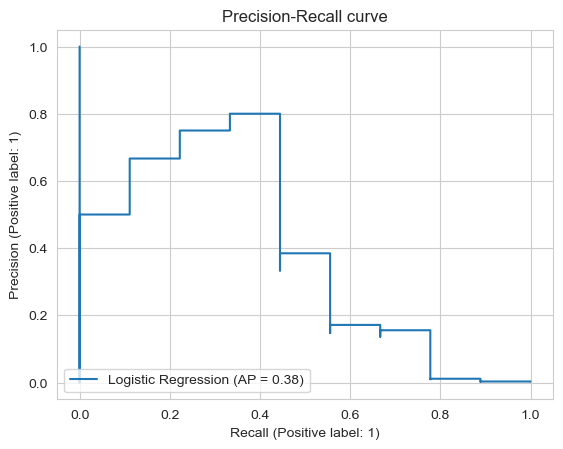

In [133]:
from sklearn.metrics import PrecisionRecallDisplay

display = PrecisionRecallDisplay.from_estimator(
    model, X_test[subsets[10]], y_test, name="Logistic Regression")
_ = display.ax_.set_title("Precision-Recall curve")

In [125]:
alt.data_transformers.disable_max_rows()

alt.Chart(data[data['is_retracted']==0]).mark_bar().encode(
    alt.X('cited_by_count', bin=True),
    y='count()'
)

alt.Chart(...)